In [ ]:
%load_ext autoreload
%autoreload 2

from google.colab import drive
import os
import glob
import json
import pandas as pd
import PIL
from PIL import Image, ImageDraw
import zipfile
import re
import numpy as np
import requests
import matplotlib.pyplot as plt
import h5py
import urllib.request

PIL.Image.MAX_IMAGE_PIXELS = 2789296047 

drive.mount('/content/gdrive')

Mounted at /content/gdrive
/content/gdrive/MyDrive/Documents/Masters/7CCSMPRJ - Individual Project/experiments/data/london


In [ ]:
df = pd.read_csv('data.csv')
df.sort_values('count').tail(30)

,Unnamed: 0,filename,count
28,28,wm_262126_4_174161_4_19.json,79
52,52,fn_261896_4_174161_4_19.json,79
44,44,cr_261973_4_174260_4_19.json,80
83,83,bp_262118_4_174541_4_19.json,82
45,45,cr_261973_4_174264_4_19.json,82
33,33,sc_261904_4_174259_4_19.json,85
70,70,kg_261737_4_174522_4_19.json,88
51,51,fn_261892_4_174165_4_19.json,93
42,42,cr_261969_4_174260_4_19.json,93
66,66,cl_261910_4_174455_4_19.json,99


In [ ]:
img_folder = os.path.join(os.getcwd(), 'jsons')
file_lst = os.listdir(img_folder)
json_lst = [os.path.join(img_folder, x) for x in file_lst if '.json' in x]
json_lst

### GT Points

In [ ]:
dct2 = {
    'filename': [],
    'count': []
}

for json_filepath in json_lst:
    _, filename = os.path.split(json_filepath)
    print(filename)
    with open(json_filepath) as f:
        dct = json.load(f)

    points = []
    for tree in dct['shapes']:
        points.append(tree['points'][0])
    points = np.array(points).astype(int)
    points_filepath = json_filepath.replace('jsons', 'gt_points').replace('.json', '.csv')
    df = pd.DataFrame(points)
    # df.to_csv(points_filepath, header=None, index=None)

    dct2['filename'].append(filename)
    dct2['count'].append(len(df))

td_261698_4_174474_4_19.json
bs_261922_4_174326_4_19.json
bs_261922_4_174330_4_19.json
bs_261926_4_174326_4_19.json
hh_261904_4_174207_4_19.json
hh_261904_4_174211_4_19.json
hh_261908_4_174207_4_19.json
hh_261908_4_174211_4_19.json
hn_262078_4_174230_4_19.json
hn_262078_4_174234_4_19.json
hn_262082_4_174230_4_19.json
hn_262082_4_174234_4_19.json
kn_261727_4_174542_4_19.json
kn_261727_4_174546_4_19.json
kn_261731_4_174542_4_19.json
kn_261731_4_174546_4_19.json
rc_261710_4_174452_4_19.json
rc_261710_4_174456_4_19.json
rc_261714_4_174452_4_19.json
rc_261714_4_174456_4_19.json
td_261698_4_174478_4_19.json
td_261702_4_174474_4_19.json
td_261702_4_174478_4_19.json
vp_262092_4_174266_4_19.json
vp_262092_4_174270_4_19.json
vp_262096_4_174266_4_19.json
vp_262096_4_174270_4_19.json
wm_262126_4_174157_4_19.json
wm_262126_4_174161_4_19.json
wm_262130_4_174157_4_19.json
wm_262130_4_174161_4_19.json
bs_261926_4_174330_4_19.json
sc_261904_4_174255_4_19.json
sc_261904_4_174259_4_19.json
sc_261908_4_17

## GT Map

In [ ]:
delete_file_lst = glob.glob(os.path.join(os.getcwd(), 'gt_map', '*.h5'))
for file in delete_file_lst:
    os.remove(file)

file_lst = glob.glob(os.path.join(os.getcwd(), 'img', '*.jpg'))

for img_filename in file_lst:
    img_filepath = os.path.join(os.getcwd(), 'img', img_filename)
    points_filepath = img_filepath.replace('img', 'gt_points').replace('.jpg', '.csv')

    im = PIL.Image.open(img_filepath)
    width, height = im.size
    points = pd.read_csv(points_filepath, index_col=None, header=None).values

    gt_map = np.zeros((height, width))

    for x, y in points:
        if x < width and y < height:
            gt_map[y, x]=1
        else:
            print(outside)
    gt_map_path = img_filepath.replace('.jpg', '.h5').replace('img', 'gt_map')
    with h5py.File(gt_map_path, 'w') as hf:
        hf['gt_map'] = gt_map
    print(f'{gt_map_path} saved.')

### Data

In [ ]:
df_all = pd.DataFrame(columns=['filepath', 'filename', 'region', 'count'])

file_lst = glob.glob(os.path.join(os.getcwd(), 'img', '*.jpg'))

for i, filepath in enumerate(file_lst):
    csv_filepath = filepath.replace('img', 'gt_points').replace('.jpg', '.csv')
    df = pd.read_csv(csv_filepath, header=None)

    _, filename = os.path.split(filepath)
    region = filename[0:2]
    
    count = len(df)
    df_all.loc[i] = (filepath, filename, region, count)

df_all['count'] = df_all['count'].astype(int)
df_all

,filepath,filename,region,count
0,/content/gdrive/MyDrive/Documents/Masters/7CCS...,hh_261904_4_174207_4_19.jpg,hh,27
1,/content/gdrive/MyDrive/Documents/Masters/7CCS...,hh_261904_4_174211_4_19.jpg,hh,109
2,/content/gdrive/MyDrive/Documents/Masters/7CCS...,hh_261908_4_174207_4_19.jpg,hh,49
3,/content/gdrive/MyDrive/Documents/Masters/7CCS...,hh_261908_4_174211_4_19.jpg,hh,68
4,/content/gdrive/MyDrive/Documents/Masters/7CCS...,td_261698_4_174474_4_19.jpg,td,44
...,...,...,...,...
86,/content/gdrive/MyDrive/Documents/Masters/7CCS...,bp_262122_4_174545_4_19.jpg,bp,160
87,/content/gdrive/MyDrive/Documents/Masters/7CCS...,sr_262183_4_174543_4_19.jpg,sr,116
88,/content/gdrive/MyDrive/Documents/Masters/7CCS...,sr_262183_4_174547_4_19.jpg,sr,71
89,/content/gdrive/MyDrive/Documents/Masters/7CCS...,sr_262187_4_174543_4_19.jpg,sr,216


In [ ]:
df_all.groupby('region')['count'].mean()

region
bp     82.500000
bs     19.000000
cd     45.000000
cl     69.750000
cr     83.000000
el    132.500000
fn     87.000000
hh     63.250000
hn     47.000000
is     60.500000
kg     78.333333
kn     81.500000
ng     92.750000
rc     70.750000
rp     67.500000
sc     65.750000
sg     37.500000
sr    137.500000
st     74.500000
td     63.750000
vp     50.750000
wb    123.000000
wm     63.750000
Name: count, dtype: float64

In [ ]:
df_all.sum()

filepath    /content/gdrive/My Drive/Documents/Masters/7CC...
filename    hh_261904_4_174207_4_19.jpghh_261904_4_174211_...
region      hhhhhhhhtdtdtdtdrcrcrcrcknknknknvpvpvpvphnhnhn...
count                                                    6709
dtype: object

## Train val test

In [ ]:
df_train = df_all.sample(frac=0.7)
train_filelist = df_train.filepath.tolist()
# train_filelist = [os.path.join(os.getcwd(), 'img', x.replace('.xml', '.tif')) for x in train_filelist]

df2 = df_all.drop(df_train.index)
df_test = df2.sample(frac=0.48)
test_filelist = df_test.filepath.tolist()
# test_filelist = [os.path.join(os.getcwd(), 'img', x.replace('.xml', '.tif')) for x in test_filelist]

df3 = df2.drop(df_test.index)
df_val = df3
val_filelist = df_val.filepath.tolist()
# val_filelist = [os.path.join(os.getcwd(), 'img', x.replace('.xml', '.tif')) for x in val_filelist]

df_train.mean(), df_test.mean(), df_val.mean()

(count    72.9375
 dtype: float64, count    78.846154
 dtype: float64, count    72.571429
 dtype: float64)

In [ ]:
df_train.count(), df_test.count(), df_val.count()

(filepath    64
 filename    64
 region      64
 count       64
 dtype: int64, filepath    13
 filename    13
 region      13
 count       13
 dtype: int64, filepath    14
 filename    14
 region      14
 count       14
 dtype: int64)

In [ ]:
df_train.groupby('region')['count'].mean(), df_test.groupby('region')['count'].mean(), df_val.groupby('region')['count'].mean()

(region
 bp     56.666667
 bs     23.666667
 cd     39.666667
 cl     70.666667
 cr     83.000000
 el    163.500000
 fn     93.000000
 hh     68.000000
 hn     52.000000
 is     62.666667
 kg     78.000000
 kn     81.500000
 ng     87.333333
 rc     70.750000
 rp     67.500000
 sc     65.750000
 sg     30.666667
 sr    144.666667
 st     82.500000
 td     21.000000
 vp     52.000000
 wb    111.333333
 wm     69.000000
 Name: count, dtype: float64, region
 el     76.0
 fn     69.0
 hn     42.0
 kg     79.0
 sg     58.0
 sr    116.0
 st     66.5
 td     86.5
 wb    158.0
 wm     79.0
 Name: count, dtype: float64, region
 bp    160.0
 bs      5.0
 cd     61.0
 cl     67.0
 el    127.0
 fn     93.0
 hh     49.0
 is     54.0
 ng    109.0
 td     61.0
 vp     49.5
 wm     38.0
 Name: count, dtype: float64)

In [ ]:
lst = [
    ('train', train_filelist),
    ('val', val_filelist),
    ('test', test_filelist)
]

for name, filelist in lst:
    filename = f'{name}.json'
    with open(filename, 'w') as f:
        json.dump(filelist, f, indent = 4)

In [ ]:
df_all['count'].mean()

73.72527472527473

### Example Image

(1024, 1024)


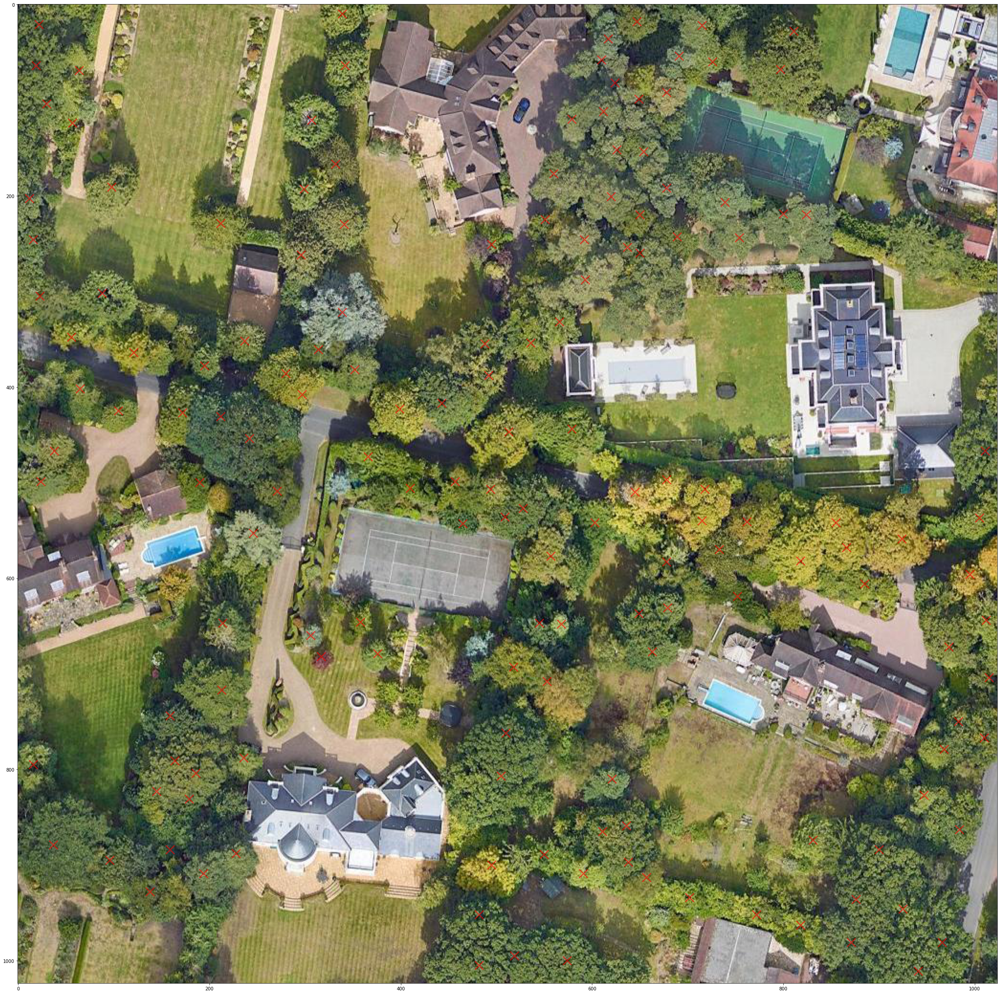

In [ ]:
filename = 'wb_261494_4_174683_4_19.jpg'
img_filepath = os.path.join(os.getcwd(), 'img', filename)
points_filepath = os.path.join(os.getcwd(), 'gt_points', filename.replace('.jpg', '.csv'))
points = pd.read_csv(points_filepath, header=None).values
im = Image.open(img_filepath)

draw = ImageDraw.Draw(im)
size = 5
width = 5

for x, y in points:
    left = max(x-size, 0)
    right = min(x+size, im.size[0])
    top = min(y+size, im.size[0])
    bottom = max(y-size, 0)
    draw.line([(left, bottom), (right, top)], fill = 'red', width = width)
    draw.line([(left, top), (right, bottom)], fill = 'red', width = width)

fig, ax = plt.subplots(figsize=(40, 40))
print(im.size)
ax.imshow(im)


## Normalisation

In [ ]:
from torch.utils import data
from PIL import Image
import torchvision

class London(data.Dataset):
    def __init__(self, data_files, mode, main_transform):
        self.main_transform = main_transform
        self.data_files = data_files
        self.num_samples = len(self.data_files)

    def __getitem__(self, index):
        img_filepath = self.data_files[index]

        img = self.read_image(img_filepath)
        if self.main_transform is not None:
            img = self.main_transform(img)
        return img

    def __len__(self):
        return self.num_samples

    def read_image(self, img_filepath):
        img = Image.open(img_filepath)
        if img.mode == 'L':
            img = img.convert('RGB')
        return img

    def get_num_samples(self):
        return self.num_samples

dataset_lst = glob.glob(os.path.join(os.getcwd(), 'img', '*.jpg'))

transform = torchvision.transforms.ToTensor()
london = London(dataset_lst, 'train', transform)

loader = data.DataLoader(london,
                         batch_size=1,
                         num_workers=0,
                         shuffle=False)

mean = 0.
std = 0.
for images in loader:
    batch_samples = images.size(0) # batch size (the last batch can have smaller size!)
    images = images.view(batch_samples, images.size(1), -1)
    mean += images.mean(2).sum(0)
    std += images.std(2).sum(0)

mean /= len(loader.dataset)
std /= len(loader.dataset)
mean, std

(tensor([0.4281, 0.5077, 0.3550]), tensor([0.1814, 0.1653, 0.1686]))